In [2]:
#from osgeo import gdal, gdal_array
#gdal.UseExceptions()
#gdal.AllRegister()
#import gdal
import matplotlib.pyplot as plt

import matplotlib.patches as patches # Needed to draw rectangles
from matplotlib import animation, rc
from IPython.display import HTML
# Turn on inline presentations
%matplotlib inline

import os
from pathlib import Path
import sys
import glob
import subprocess
import shlex
import time
import numpy as np
from datetime import datetime
from datetime import timedelta
inputfile = sys.argv[1]
import os.path
from os import path
from matplotlib import animation, rc
import pandas as pd



In [3]:
# Import Python 3's print function and division
from __future__ import print_function, division

# Import GDAL, NumPy, and matplotlib
#from osgeo import gdal, gdal_array
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from numpy import *
import os 


In [4]:
datafolder=r'C:\Users\vaak\Desktop\UoS\weedwatch project\S1_Vembanad\STK'
os.chdir(datafolder)
os.getcwd()
#files=glob.glob('*2019*.tif') 

'C:\\Users\\vaak\\Desktop\\UoS\\weedwatch project\\S1_Vembanad\\STK'

In [5]:
outputGEOfolder=r'C:\Users\vaak\Desktop\UoS\weedwatch project\S1_Vembanad\sigma0'

k=0
dates=[]
for tiffile in sorted(os.listdir(outputGEOfolder)):
    k=k+1
    outputname=tiffile[7:15]
    dates.append(outputname)
tindex=pd.DatetimeIndex(dates)
tindex   

DatetimeIndex(['2019-01-24', '2019-02-23', '2019-10-09', '2019-10-21',
               '2019-11-02', '2019-11-08', '2019-11-14', '2019-11-20',
               '2019-11-26', '2019-12-02', '2019-12-08', '2019-12-14',
               '2019-12-20', '2019-12-26', '2020-01-01', '2020-01-07',
               '2020-01-13', '2020-01-19', '2020-01-31', '2020-02-12',
               '2020-02-24', '2020-03-07', '2020-03-19', '2020-03-31',
               '2020-04-12', '2020-04-24', '2020-05-18', '2020-05-30',
               '2020-06-11', '2020-06-23', '2020-07-05', '2020-07-17',
               '2020-07-29', '2020-08-10', '2020-08-22', '2020-09-03',
               '2020-09-15', '2020-09-27', '2020-10-09', '2020-10-21',
               '2020-11-02', '2020-11-14', '2020-11-26', '2020-12-08'],
              dtype='datetime64[ns]', freq=None)

In [6]:
rasterstack=np.load('Stack_sigma0_20191001_20100430_Vembanadlake.npy')
rasterstack_vv=rasterstack[0,:,:,:]
rasterstack_vh=rasterstack[1,:,:,:]
rasterstack_vh.shape

(25, 1214, 775)

In [7]:
#These will select the two bands
raster_1 = rasterstack_vv[1,:,:]
raster_2 = rasterstack_vv[17,:,:]

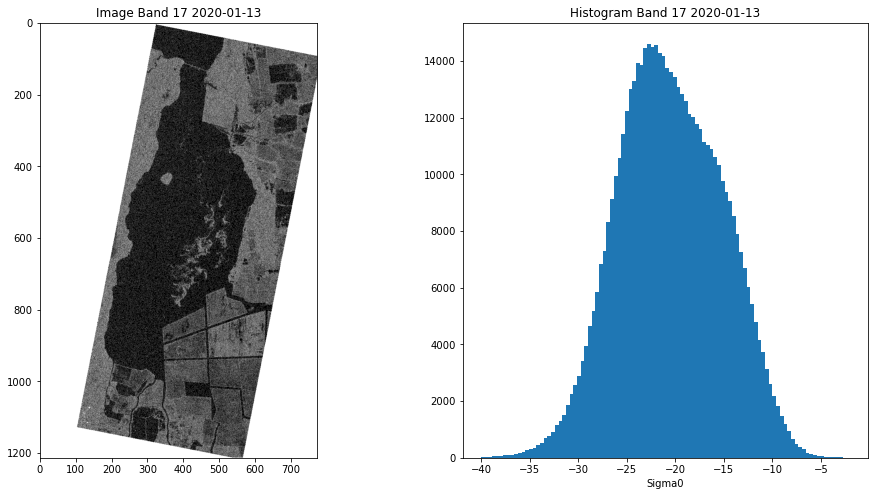

In [8]:
fig = plt.figure(figsize=(16,8)) # Initialize figure with a size
ax1 = fig.add_subplot(121) # 121 determines: 1 row, 2 plots, first plot
ax2 = fig.add_subplot(122) # 122 determines: 1 row, 2 plots, second plot
# First plot: Image
bandnbr=17
raster_1 = rasterstack_vv[bandnbr,:,:]
vmin=np.percentile(raster_1.flatten(),5)
vmax=np.percentile(raster_1.flatten(),95)
ax1.imshow(raster_1,cmap='gray',vmin=vmin,vmax=vmax)
ax1.set_title('Image Band {} {}'.format(bandnbr,
tindex[bandnbr-1].date()))
# Second plot: Historgram
# IMPORTANT: To get a histogram, we first need to *flatten*
# the two-dimensional image into a one-dimensional vector.
h = ax2.hist(raster_1.flatten(),bins=100,range=(-40,-2))
ax2.xaxis.set_label_text('Sigma0')
_=ax2.set_title('Histogram Band {} {}'.format(bandnbr,
tindex[bandnbr-1].date()))

In [9]:
def showImage(raster,tindex,bandnbr,vmin=None,vmax=None):
    fig = plt.figure(figsize=(16,8))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax1.imshow(raster,cmap='gray',vmin=vmin,vmax=vmax)
    ax1.set_title('Image Band {} {}'.format(bandnbr,
    tindex[bandnbr-1].date()))
    vmin=np.percentile(raster,2) if vmin==None else vmin #change vmin & vmax to
    #change what values are displayed
    vmax=np.percentile(raster,98) if vmax==None else vmax
    ax1.xaxis.set_label_text(
    'Linear stretch Min={} Max={}'.format(vmin,vmax))
    h = ax2.hist(raster.flatten(),bins=100,range=(vmin,vmax))
    ax2.xaxis.set_label_text('Sigma0')
    ax2.set_title('Histogram Band {} {}'.format(bandnbr,
    tindex[bandnbr-1].date()))

In [10]:
def showImagehist(rasterstack,subset,tindex,bandnbr,vmin=None,vmax=None):
    fig = plt.figure(figsize=(16,8))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax1.imshow(rasterstack[bandnbr-1,:,:],cmap='gray',vmin=vmin,vmax=vmax)
    #ax1.imshow(raster,cmap='gray',vmin=vmin,vmax=vmax)
    ax1.set_title('Image Band {} {}'.format(bandnbr,
    tindex[bandnbr-1].date()))
    vmin=np.percentile(rasterstack,2) if vmin==None else vmin #change vmin & vmax to
    #change what values are displayed
    vmax=np.percentile(rasterstack,98) if vmax==None else vmax
    ax1.xaxis.set_label_text('Linear stretch Min={} Max={}'.format(vmin,vmax))
    raster_subset=rasterstack[bandnbr-1,subset[1]:subset[1]+subset[3],subset[0]:subset[0]+subset[2]]
    ax1.add_patch(patches.Rectangle((subset[0],subset[1]),subset[2],subset[3],fill=False,edgecolor='red'))
    ax1.xaxis.set_label_text('Pixel')
    ax1.yaxis.set_label_text('Line')
    h = ax2.hist(raster_subset.flatten(),bins=100,range=(vmin,vmax))
    ax2.xaxis.set_label_text('Sigma0')
    ax2.set_title('Histogram Band {} {}'.format(bandnbr,
    tindex[bandnbr-1].date()))

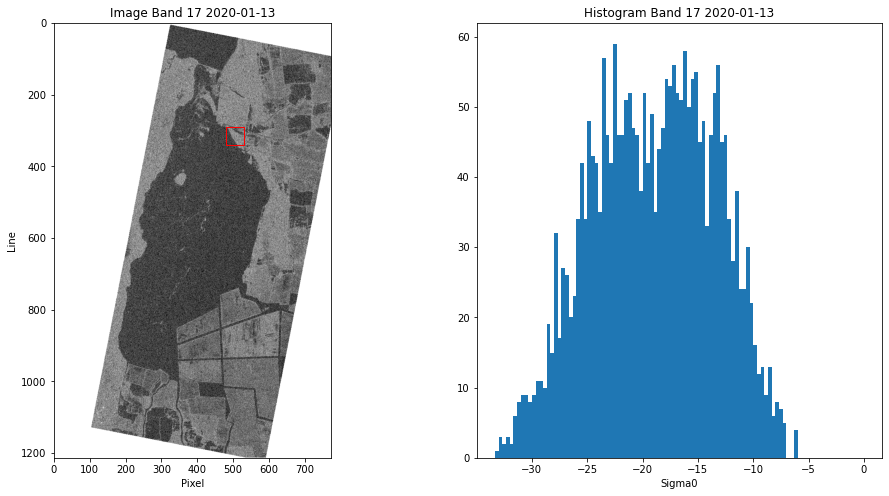

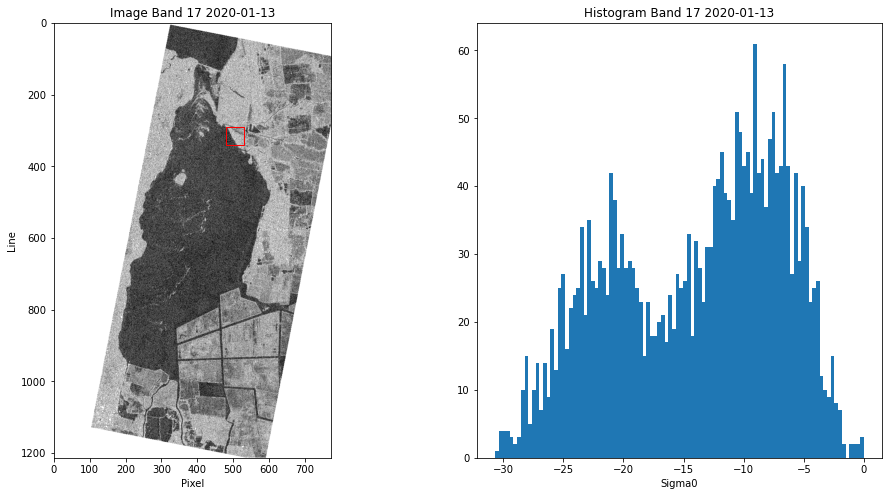

In [11]:
# ENTER YOUR CODE HERE
subset=[480,290,50,50]
bandnbr=17
vmin=np.percentile(rasterstack_vv.flatten(),0.5)
vmax=np.percentile(rasterstack_vv.flatten(),95)
showImagehist(rasterstack_vv,subset,tindex,bandnbr,vmin,vmax)
vmin=np.percentile(rasterstack_vh.flatten(),0.5)
vmax=np.percentile(rasterstack_vh.flatten(),95)
showImagehist(rasterstack_vh,subset,tindex,bandnbr,vmin,vmax)
productvvvh=rasterstack_vv*rasterstack_vh



In [12]:
def showImgSubImg(rasterstack,tindex,bandnbr,subset=None,vmin=None,vmax=None):
    #'''Input:
    #rasterstack stack of images in SAR power units
    #tindex time series date index
    #bandnbr bandnumber of the rasterstack to dissplay'''
    fig = plt.figure(figsize=(16,8))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # If vmin or vmax are None we use percentiles as limits:
    if vmin==None: vmin=np.percentile(rasterstack[bandnbr-1].flatten(),5)
    if vmax==None: vmax=np.percentile(rasterstack[bandnbr-1].flatten(),95)
    ax1.imshow(rasterstack[bandnbr-1],cmap='gray',vmin=vmin,vmax=vmax)
    ax1.set_title('Image Band {} {}'.format(bandnbr,tindex[bandnbr-1].date()))
    if subset== None:
        bands,ydim,xdim=rasterstack.shape
        subset=(0,0,xdim,ydim)
    ax1.add_patch(patches.Rectangle((subset[0],subset[1]),subset[2],subset[3],fill=False,edgecolor='red'))
    ax1.xaxis.set_label_text('Pixel')
    ax1.yaxis.set_label_text('Line')
    subsetimg=rasterstack[:,subset[1]:(subset[1]+subset[3]),subset[0]:(subset[0]+subset[2])]
    ax2.imshow(subsetimg[bandnbr-1],cmap='gray',vmin=vmin,vmax=vmax)
    ax2.set_title('Image Band {} {}'.format(bandnbr,tindex[bandnbr-1].date()))
    fig.autofmt_xdate()
    return subsetimg[bandnbr-1]

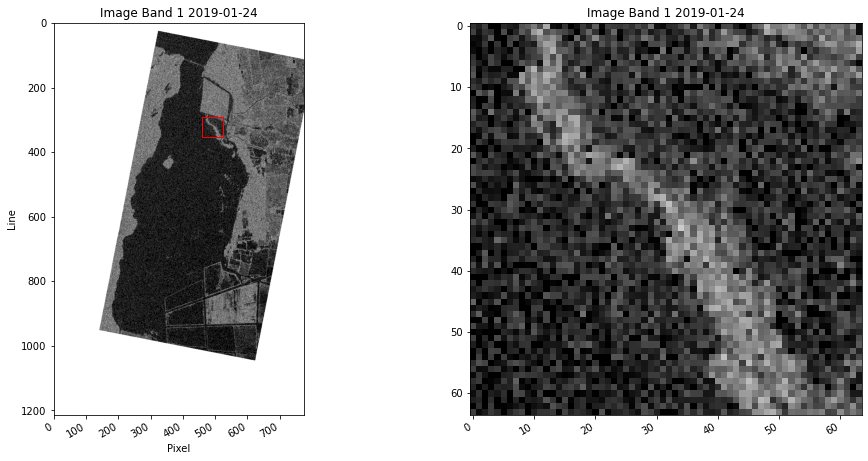

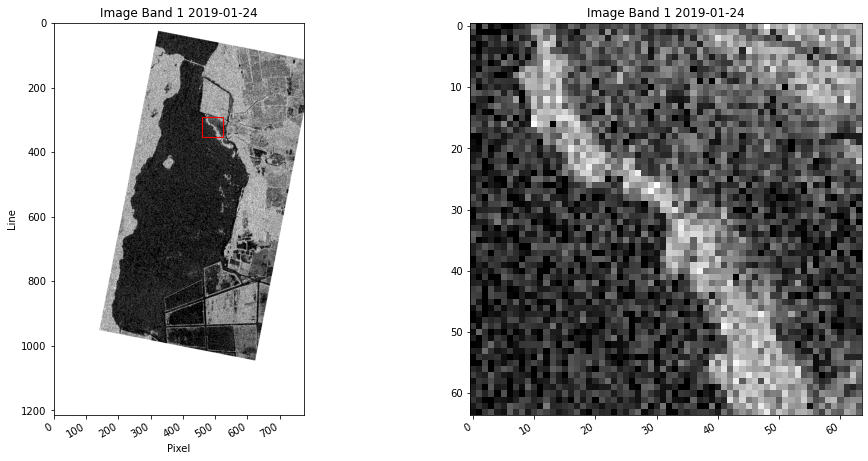

In [13]:
ws=64 #winsize 
subset=[460,290,ws,ws] 
bandnbr=1 
tindex[bandnbr-1] 
#infested water 
tr_vv_1=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset) 
tr_vh_1=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

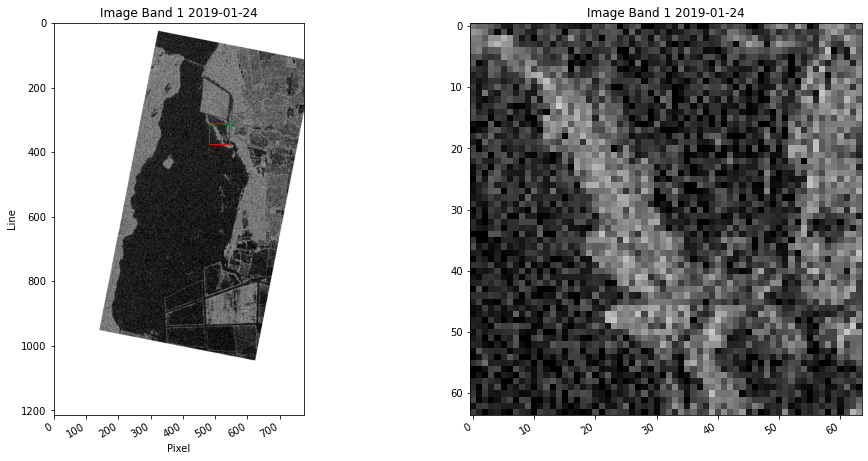

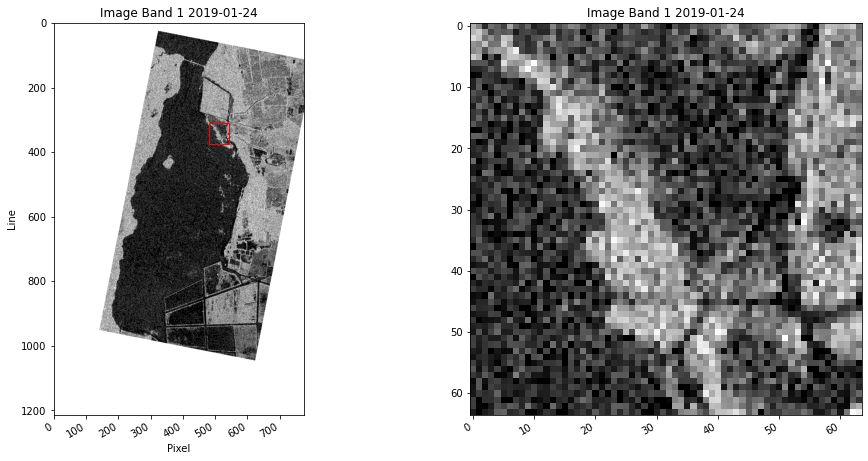

In [14]:
subset=[480,310,ws,ws] 
tr_vv_2=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_2=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


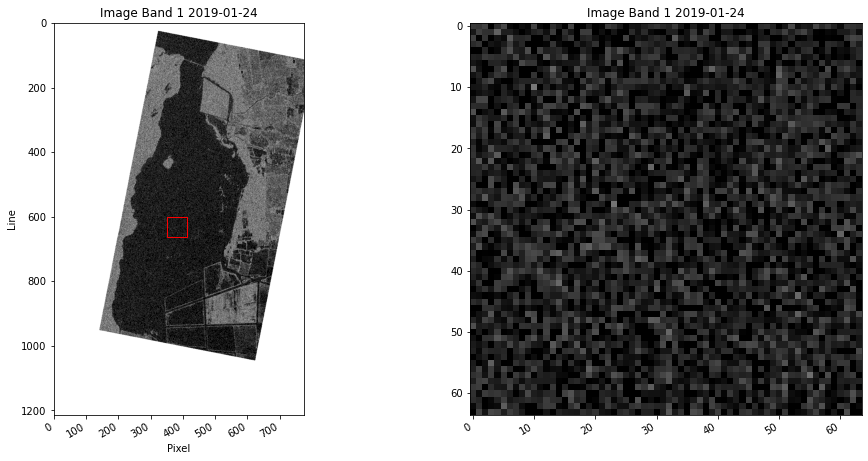

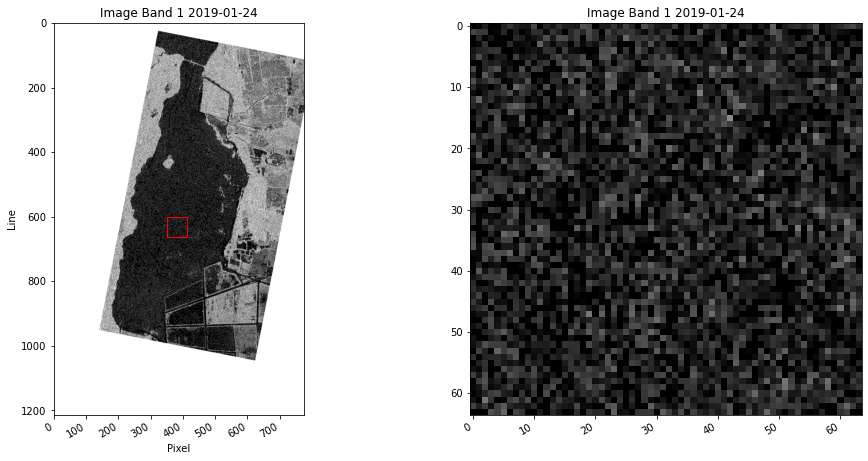

In [15]:

#clean water
subset=[350,600,ws,ws] 
tr_vv_1_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_1_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)



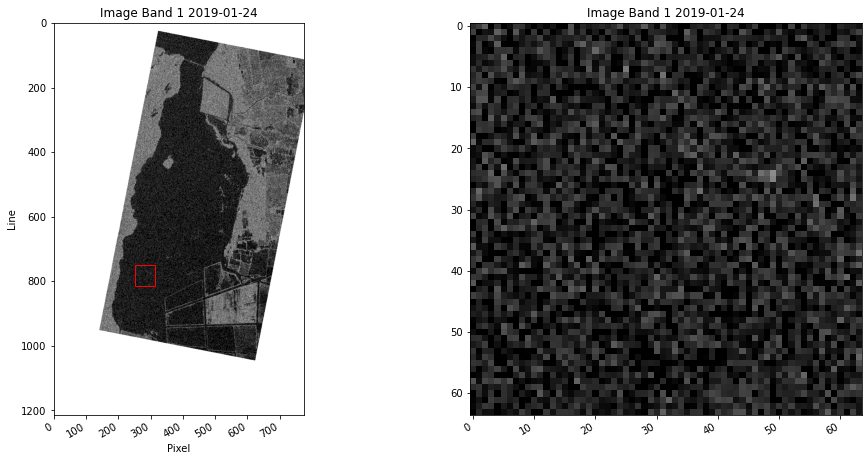

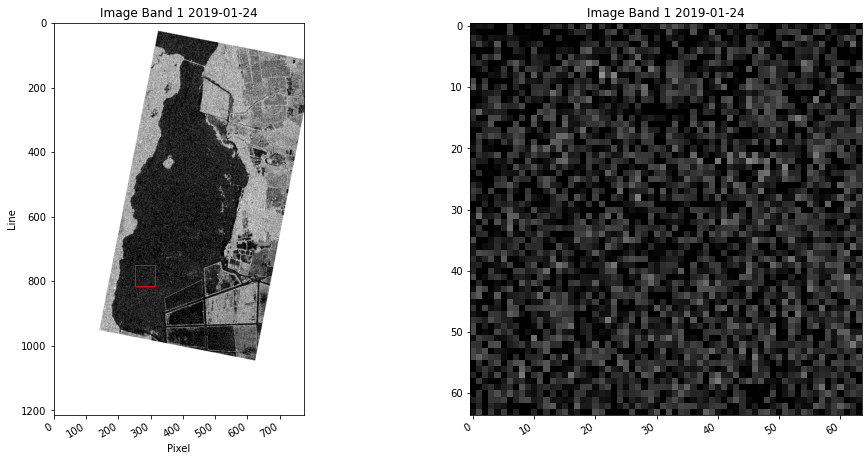

In [16]:
subset=[250,750,ws,ws] 
tr_vv_2_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_2_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


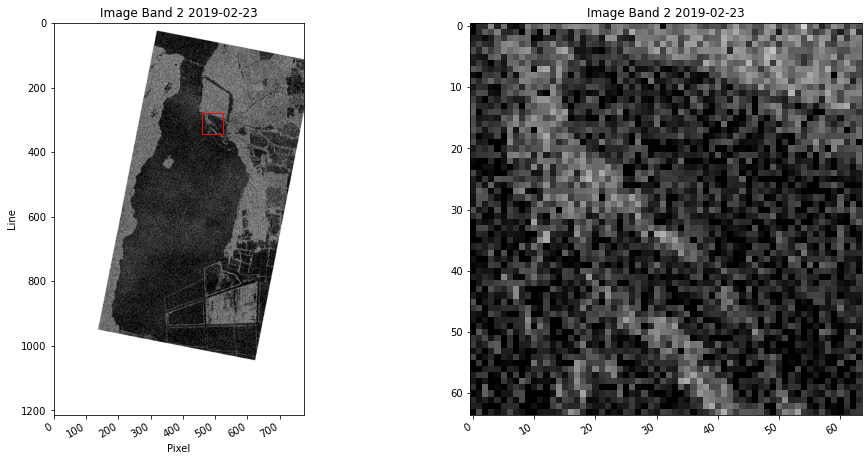

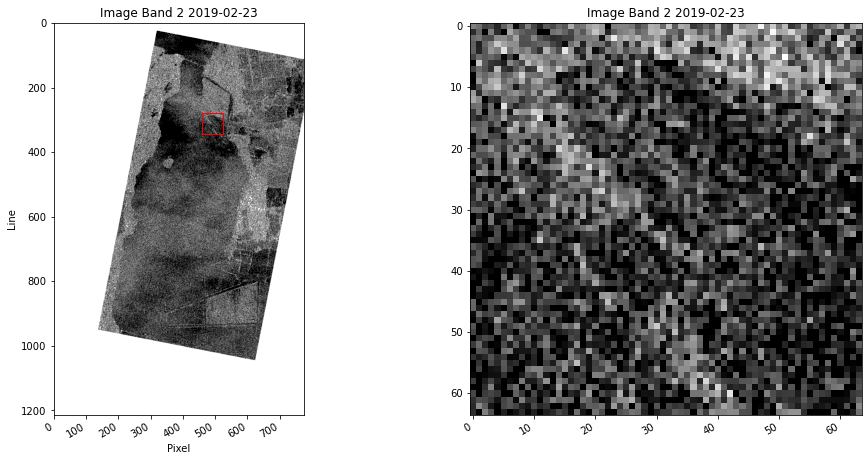

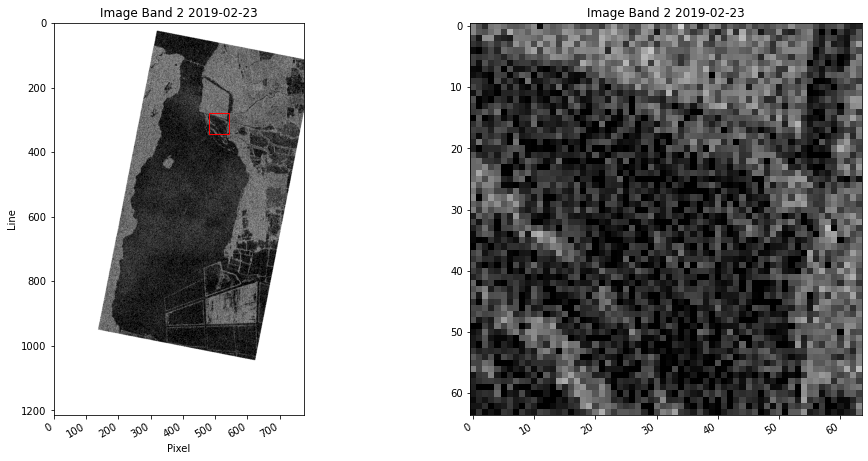

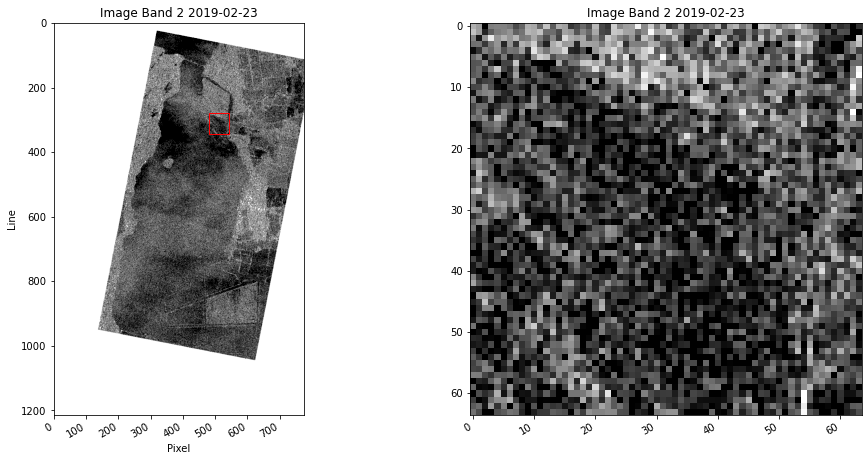

In [17]:
subset=[460,280,ws,ws]
bandnbr=2
tindex[bandnbr-1]
tr_vv_3=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_3=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


subset=[480,280,ws,ws]
tr_vv_4=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_4=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)




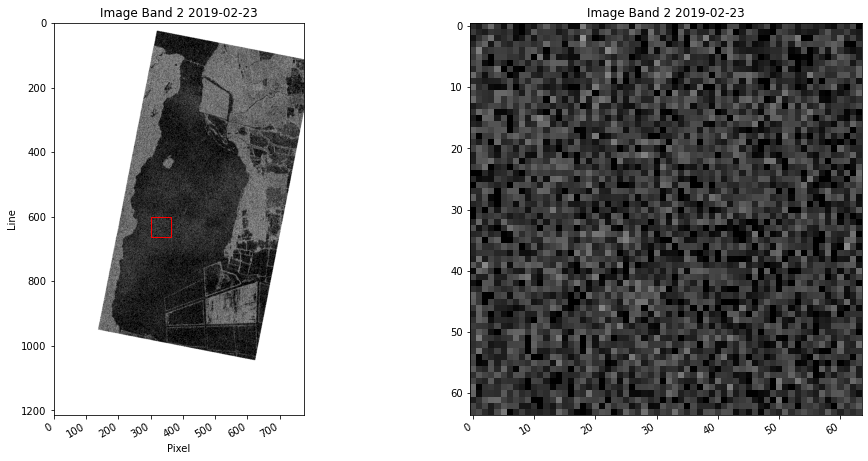

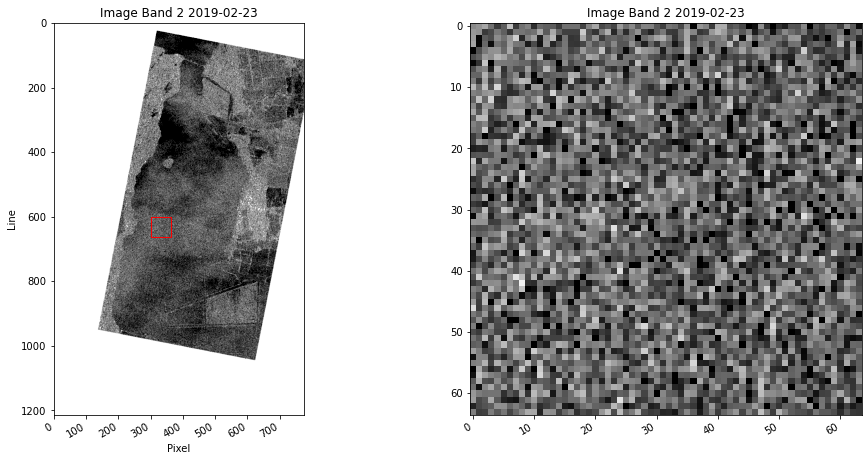

In [18]:

subset=[300,600,ws,ws] 
tr_vv_3_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_3_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

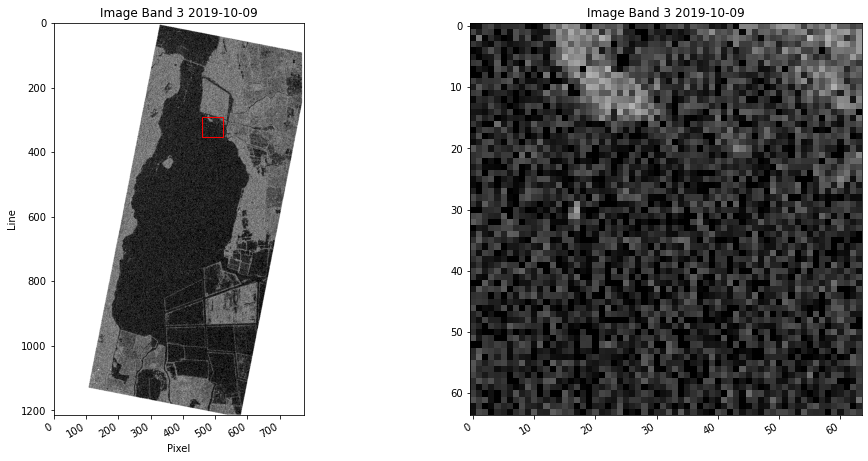

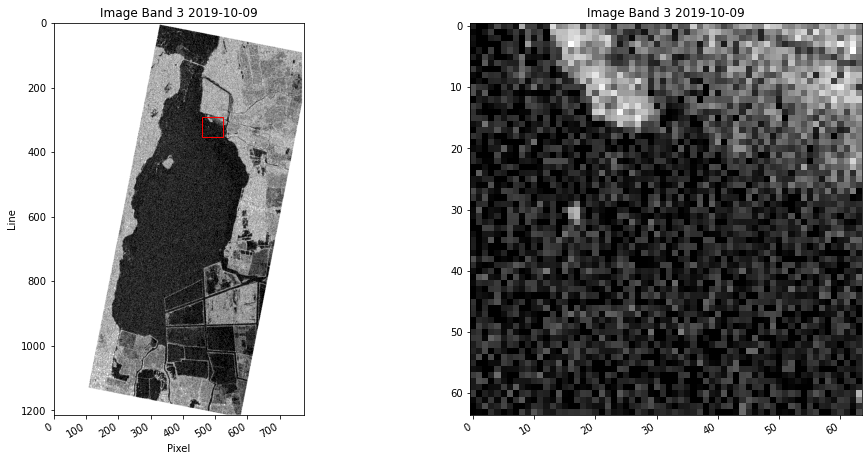

In [19]:
subset=[460,290,ws,ws]
bandnbr=3
tr_vv_5=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_5=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)



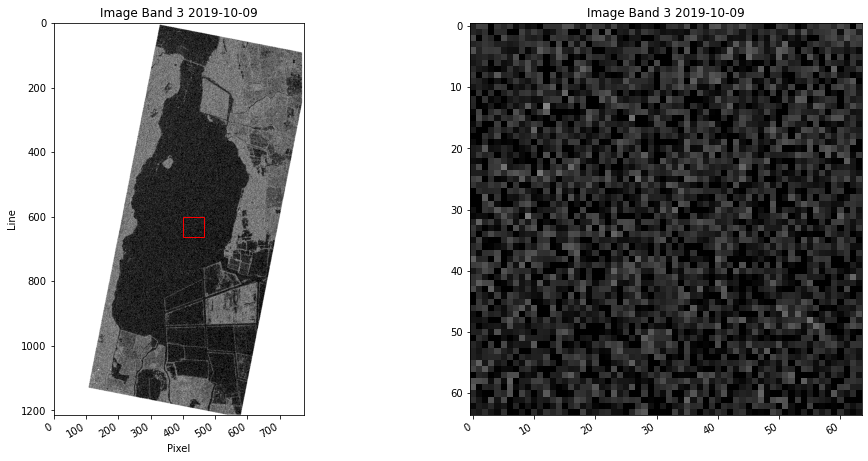

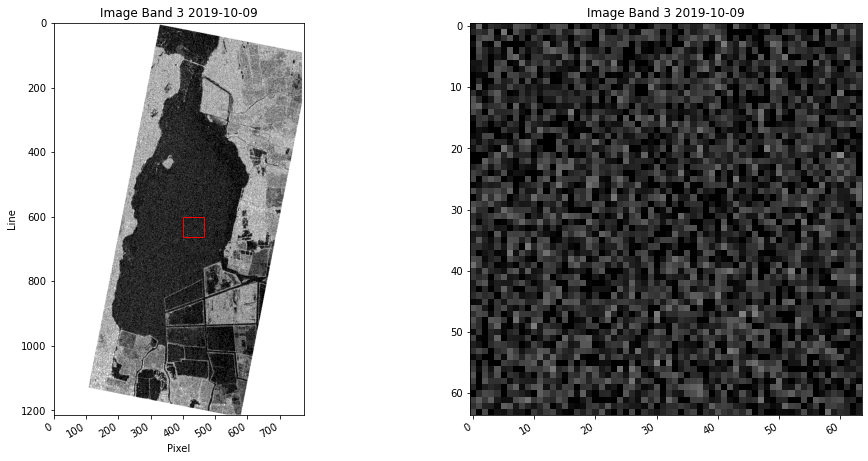

In [20]:
#clean water
subset=[400,600,ws,ws] 
tr_vv_3_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_3_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


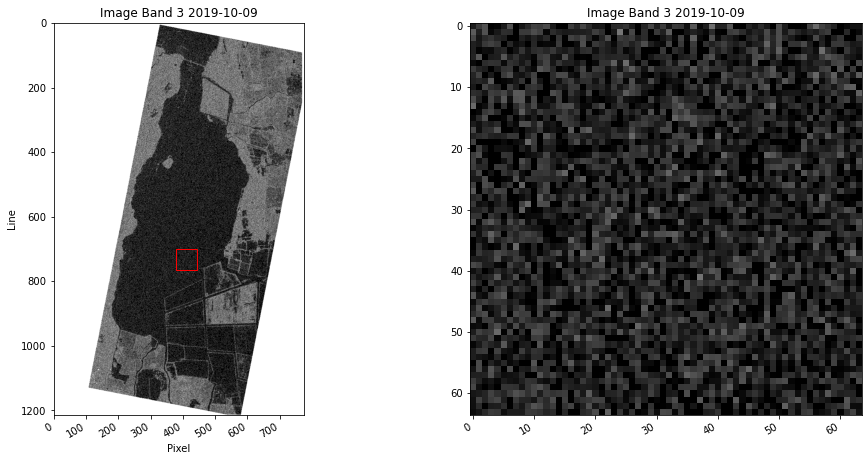

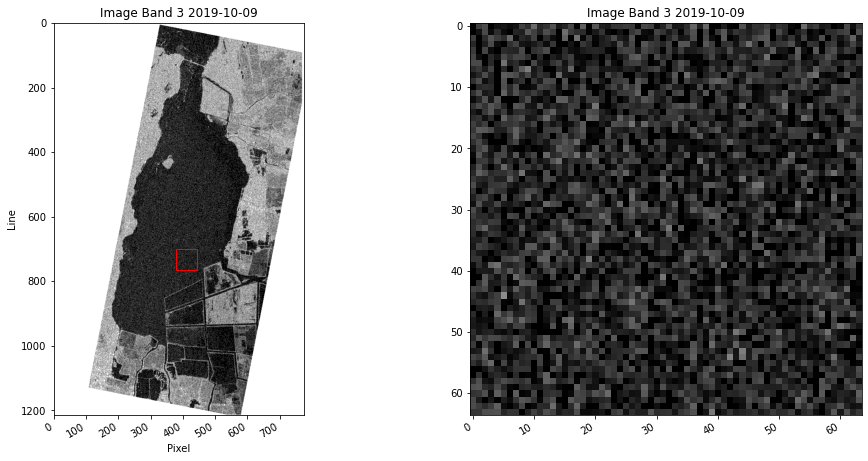

In [21]:
#clean water
subset=[380,700,ws,ws] 
tr_vv_4_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_4_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


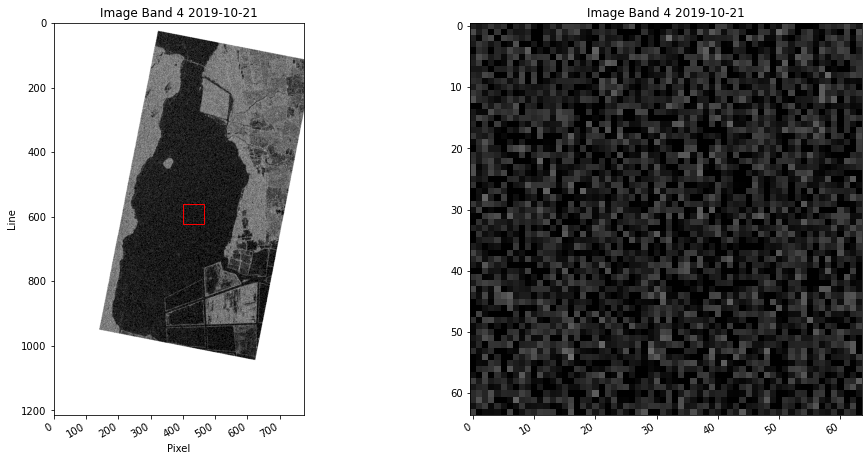

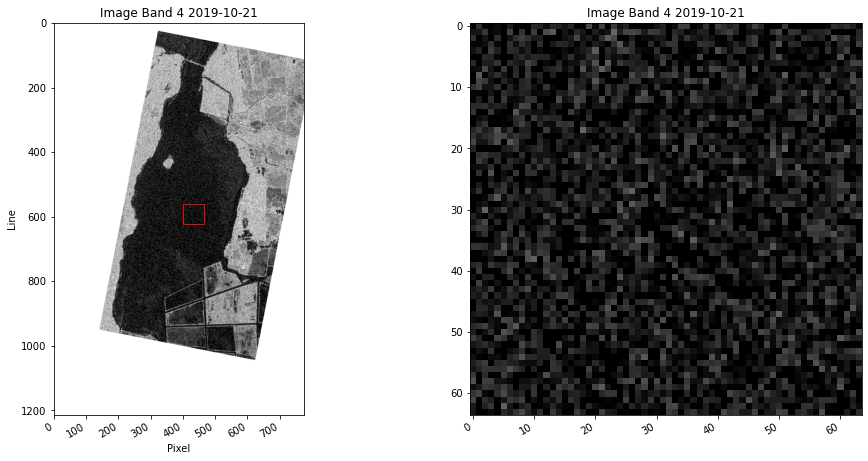

In [22]:
subset=[400,560,ws,ws]
bandnbr=4
tindex[bandnbr-1]
tr_vv_5_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_5_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


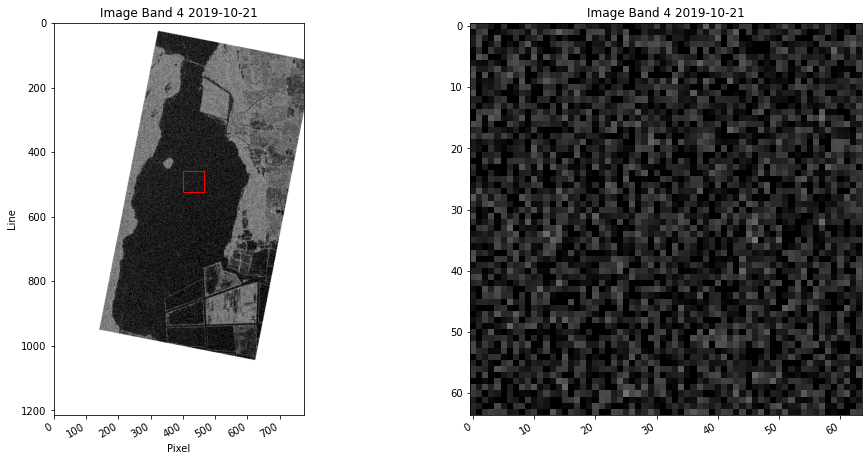

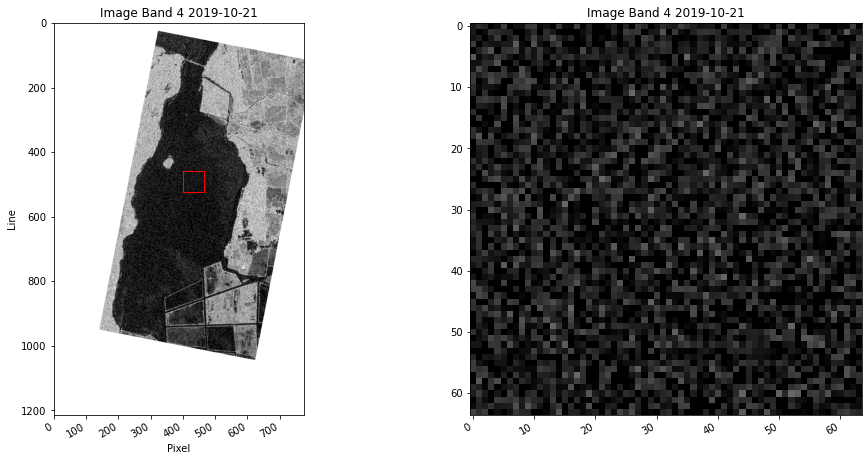

In [23]:
subset=[400,460,ws,ws]
bandnbr=4
tr_vv_6_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_6_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

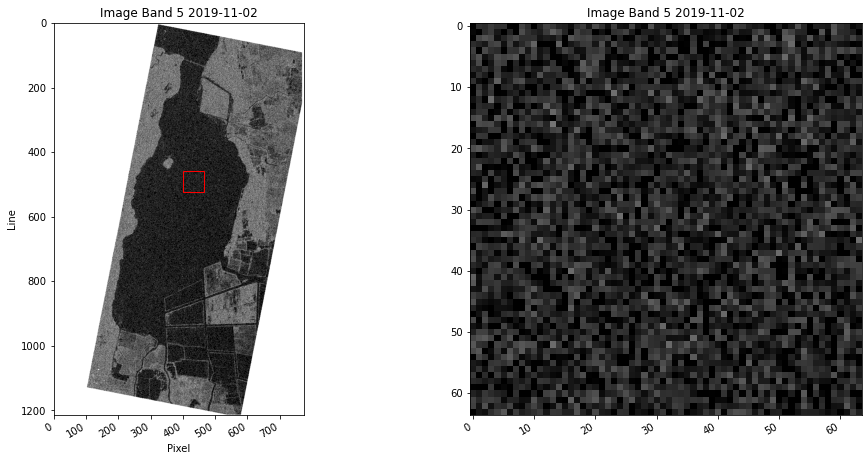

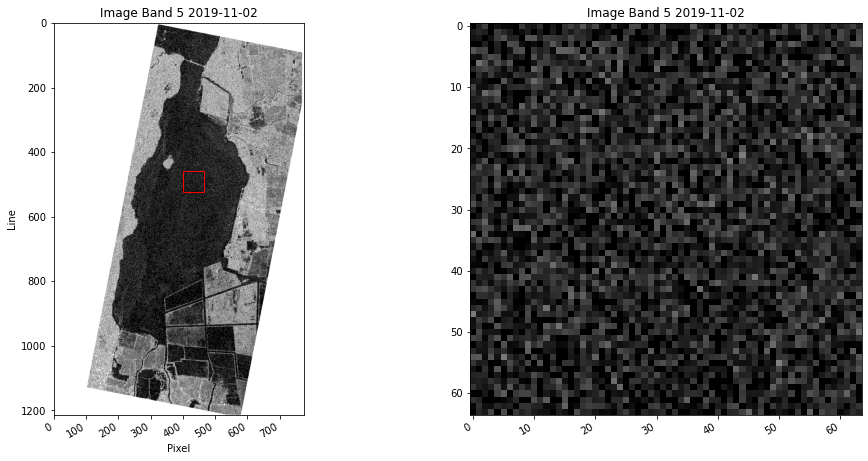

In [24]:
subset=[400,460,ws,ws]
bandnbr=5
tindex[bandnbr-1]
tr_vv_7_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_7_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

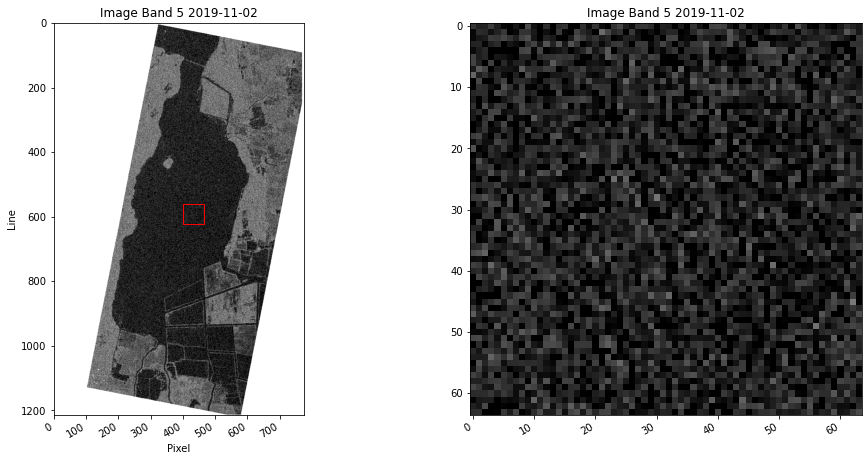

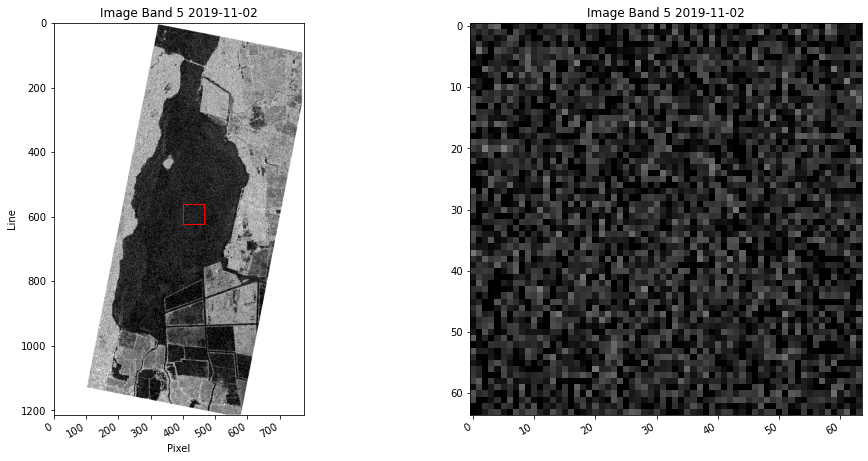

In [25]:
subset=[400,560,ws,ws]
bandnbr=5
tindex[bandnbr-1]
tr_vv_8_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_8_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

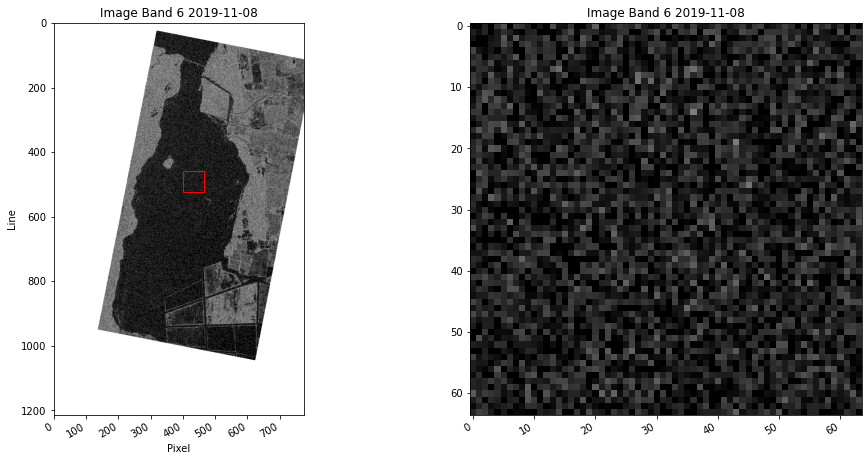

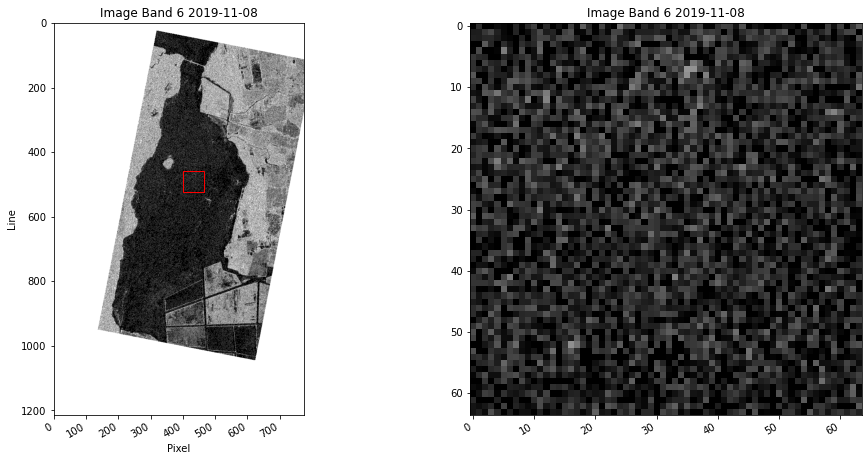

In [26]:
subset=[400,460,ws,ws]
bandnbr=6
tindex[bandnbr-1]
tr_vv_9_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_9_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

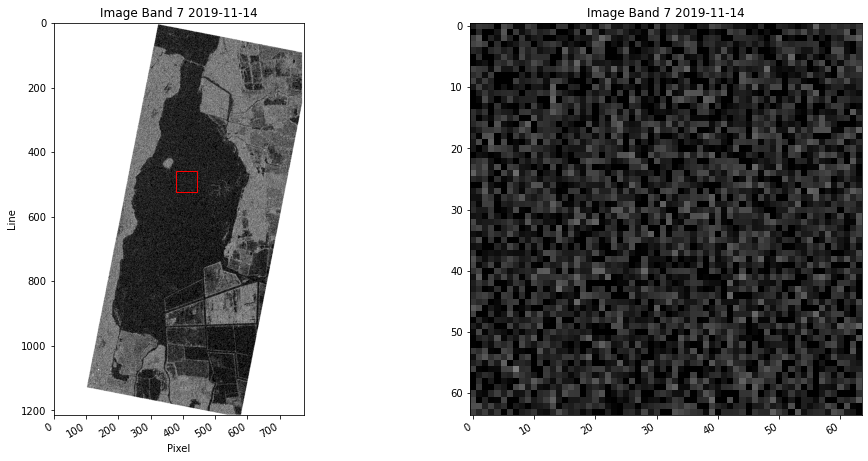

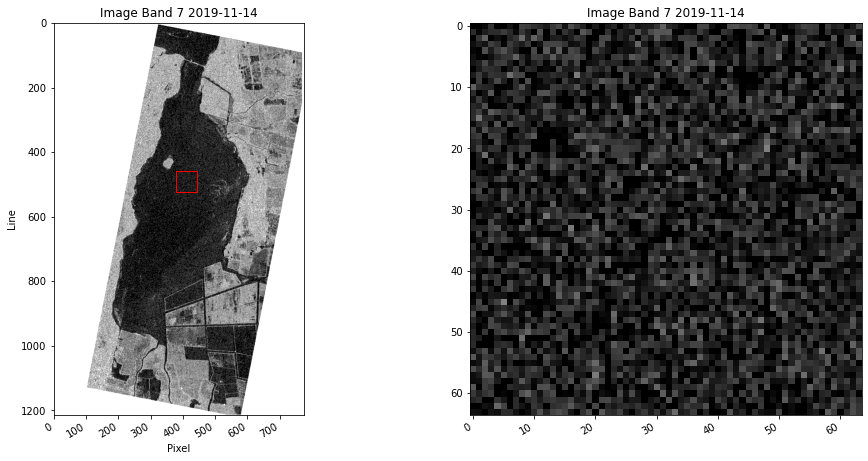

In [27]:
subset=[380,460,ws,ws]
bandnbr=7
tindex[bandnbr-1]
tr_vv_10_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_10_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

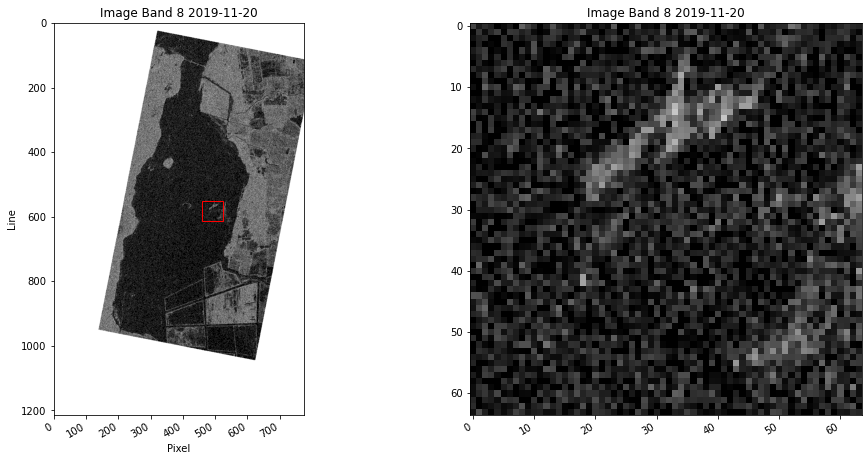

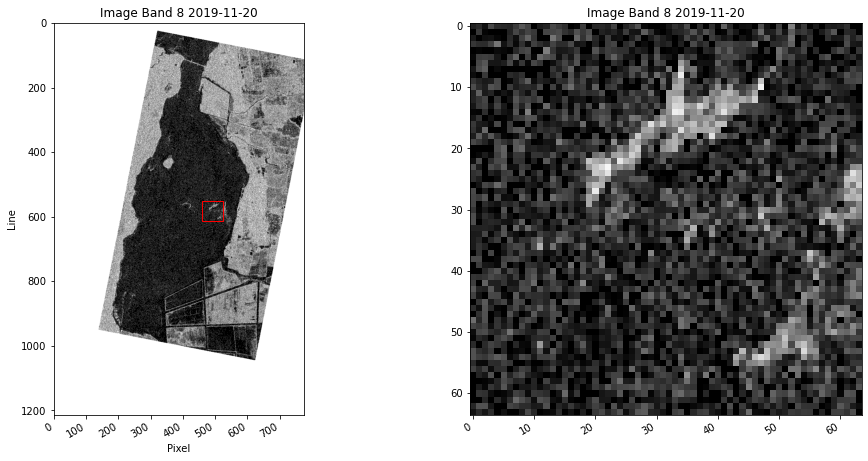

In [28]:
subset=[460,550,ws,ws]
bandnbr=8
tindex[bandnbr-1]
tr_vv_6=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_6=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)




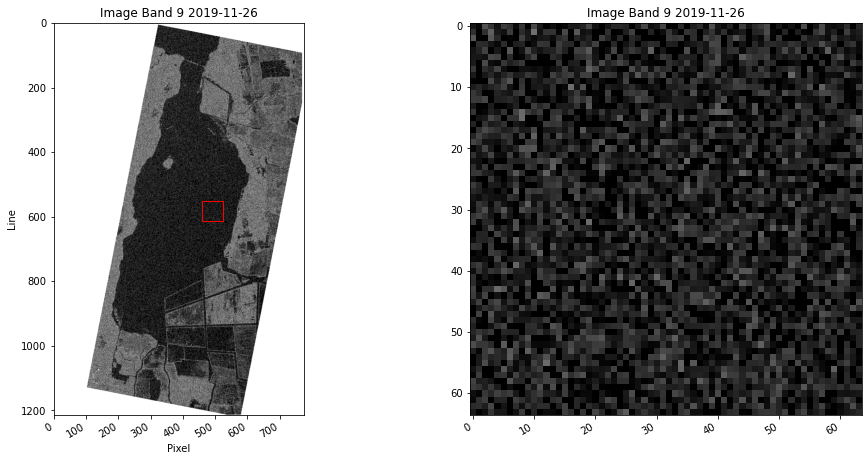

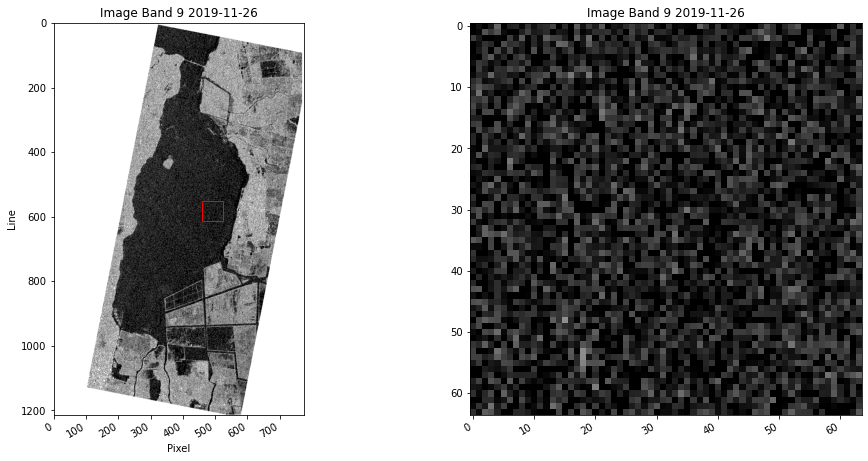

In [29]:
subset=[460,550,ws,ws]
bandnbr=9
tr_vv_11_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_11_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


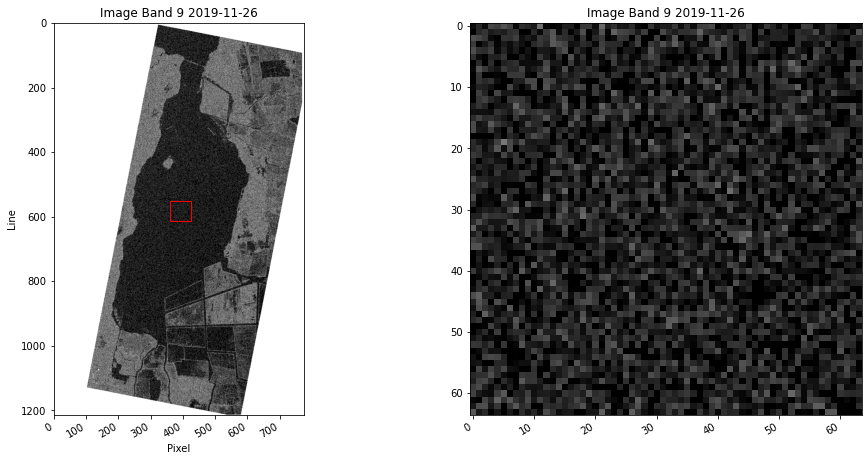

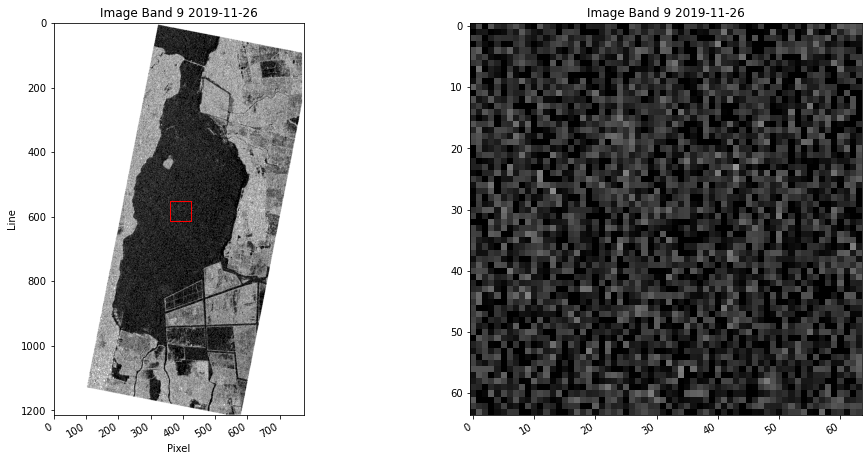

In [30]:
subset=[360,550,ws,ws]
bandnbr=9
tr_vv_12_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_12_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


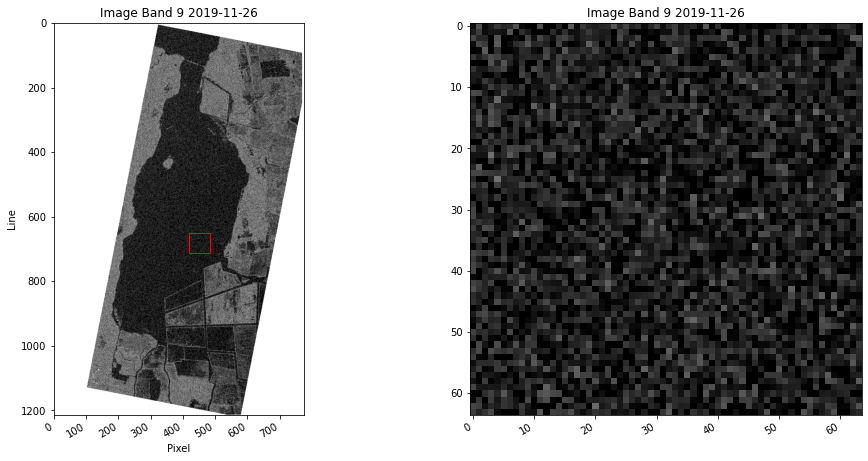

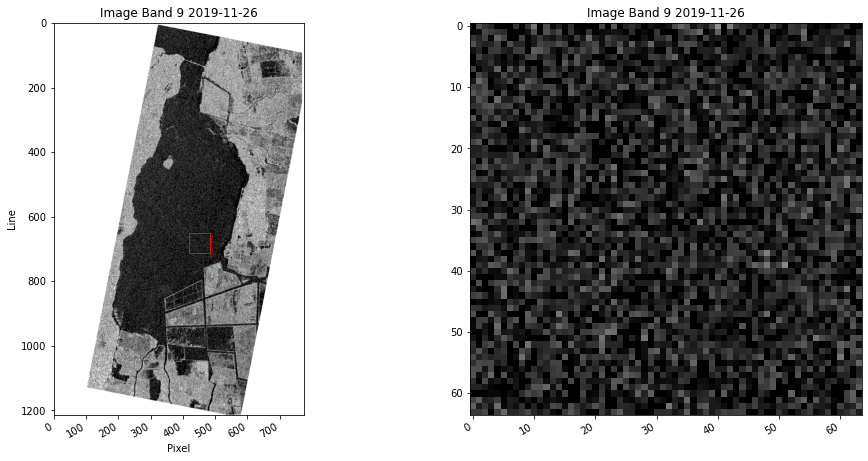

In [31]:
subset=[420,650,ws,ws]
bandnbr=9
tr_vv_13_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_13_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


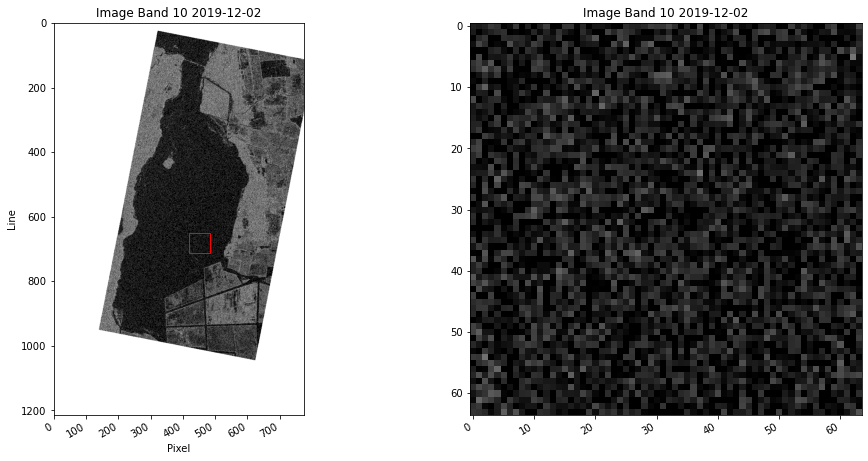

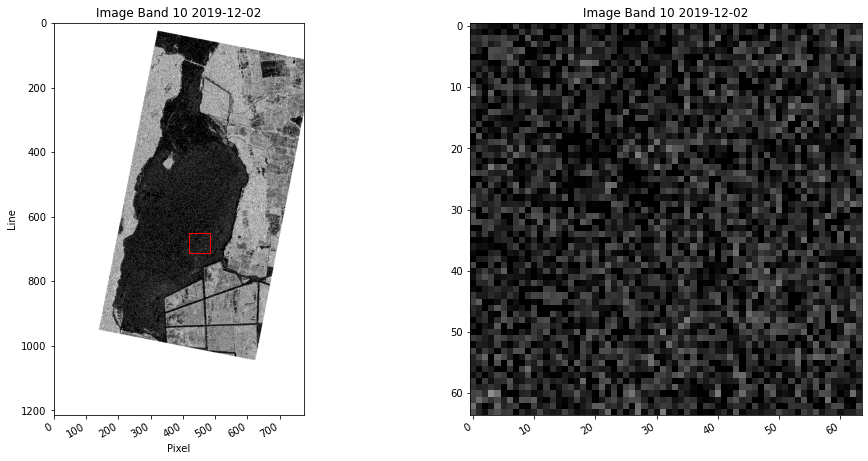

In [32]:
subset=[420,650,ws,ws]
bandnbr=10
tr_vv_14_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_14_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


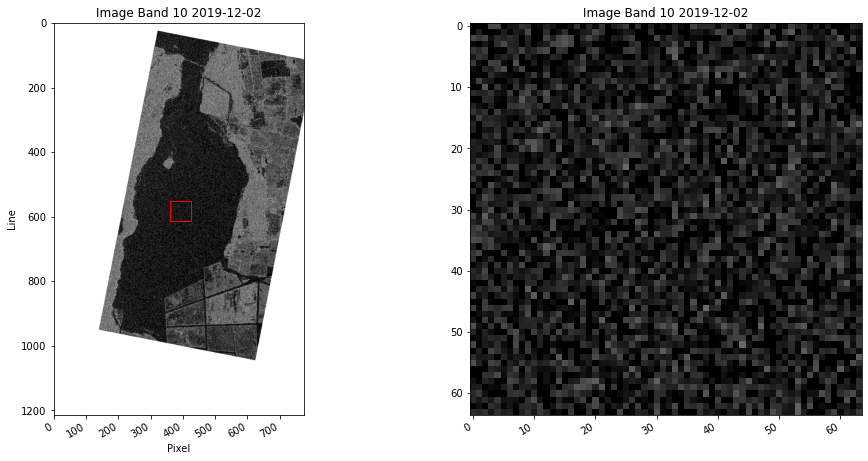

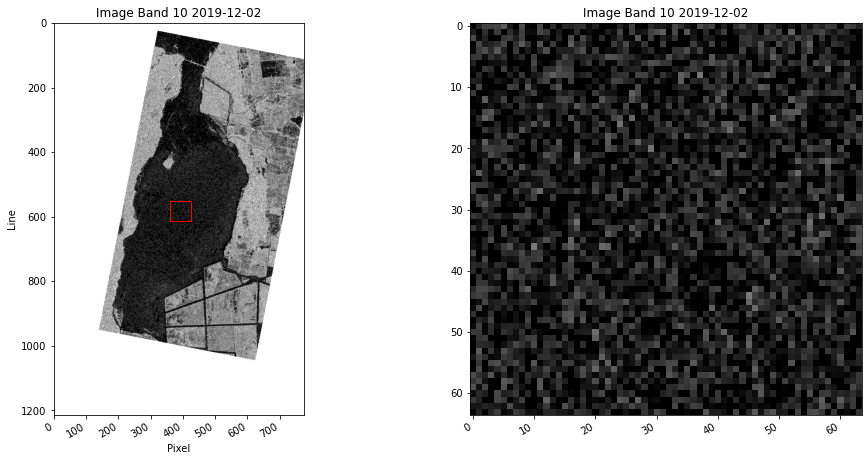

In [33]:
subset=[360,550,ws,ws]
bandnbr=10
tr_vv_15_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_15_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

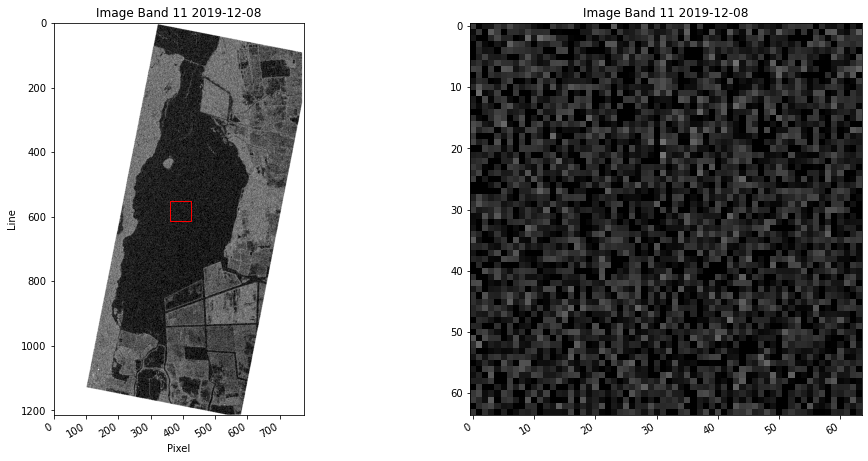

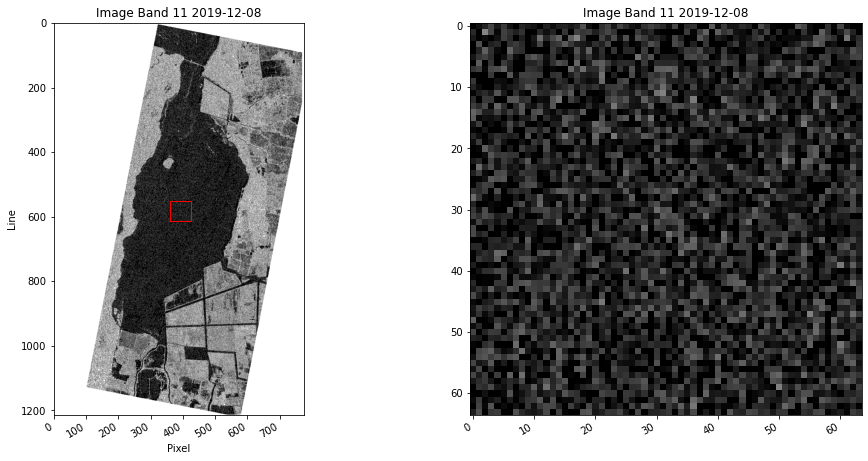

In [34]:
subset=[360,550,ws,ws]
bandnbr=11
tr_vv_16_c=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_16_c=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

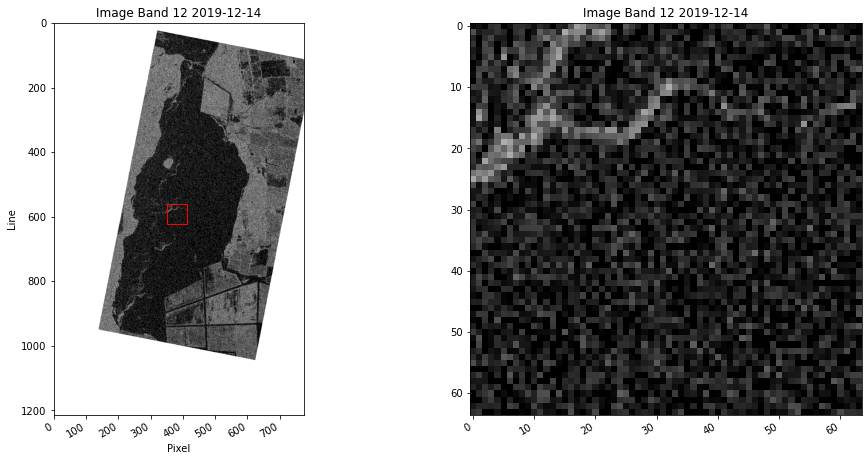

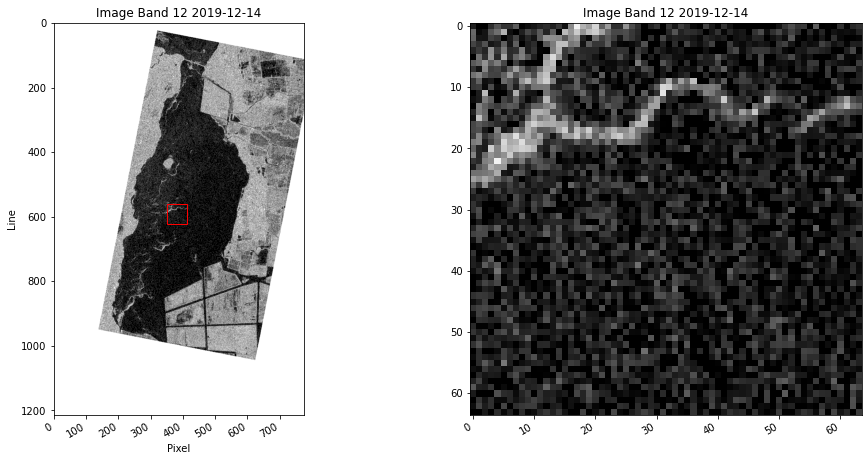

In [35]:
bandnbr=12
subset=[350,560,ws,ws]
tr_vv_7=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_7=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


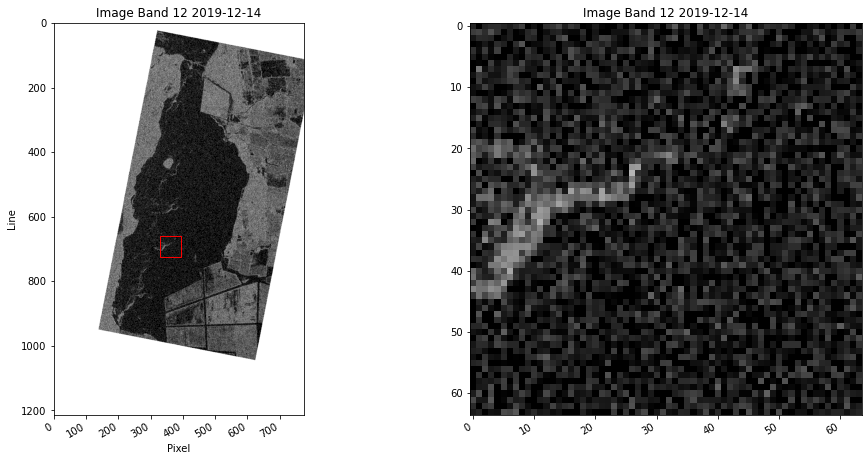

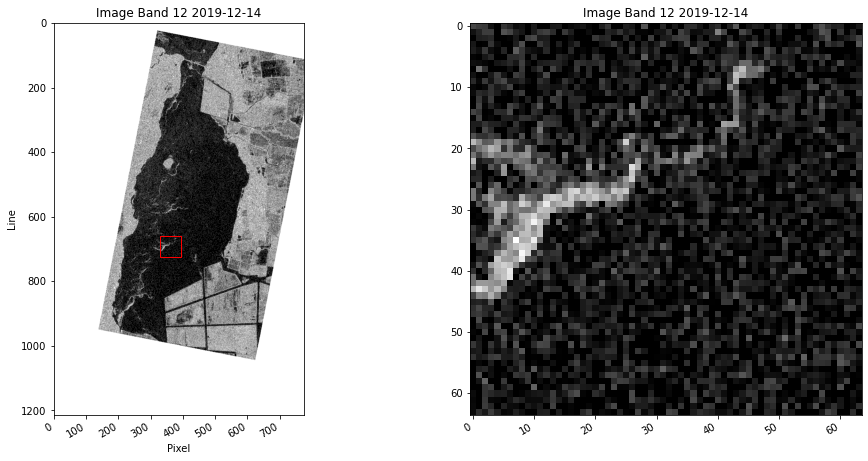

In [36]:
bandnbr=12
subset=[330,660,ws,ws]
tr_vv_8=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_8=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)



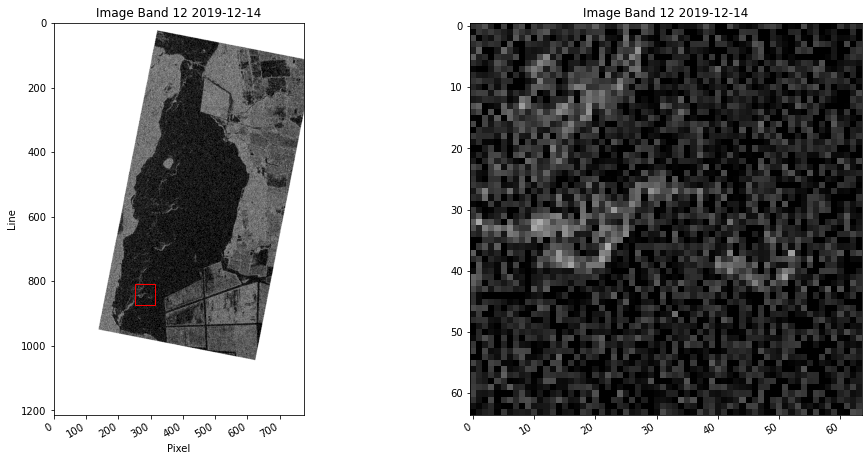

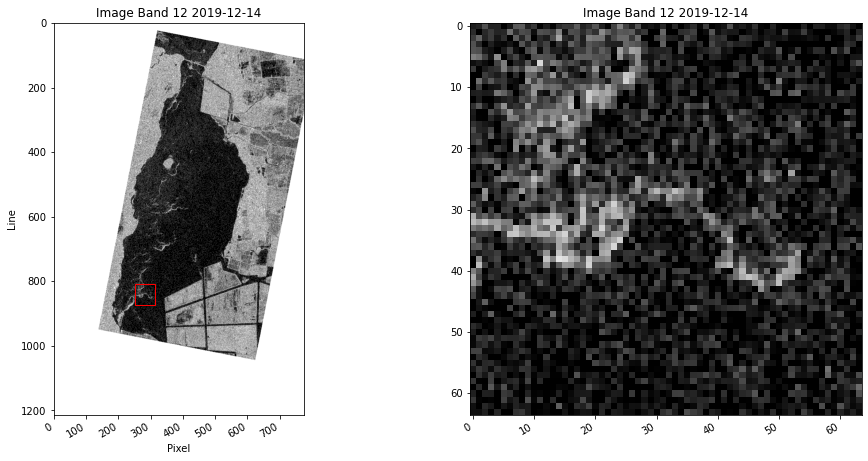

In [37]:
bandnbr=12
subset=[250,810,ws,ws]
tr_vv_9=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_9=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


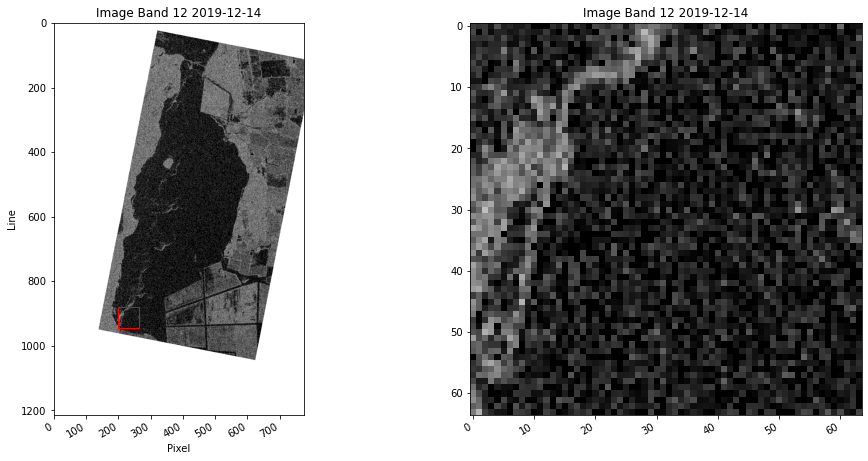

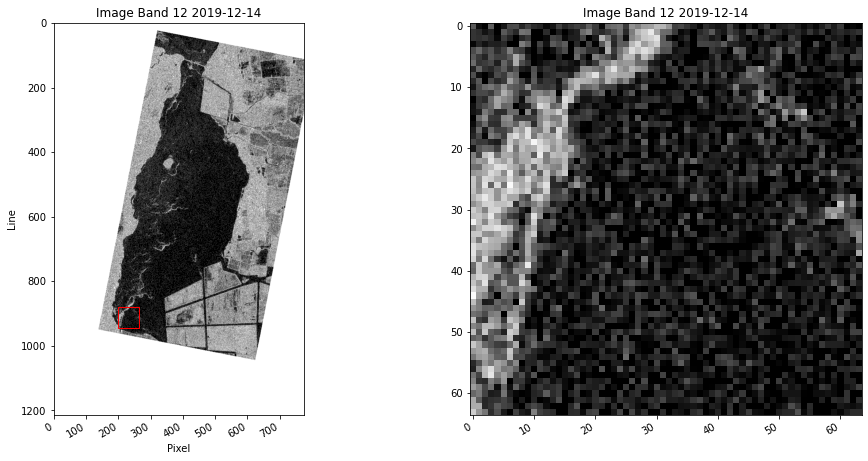

In [38]:
bandnbr=12
subset=[200,880,ws,ws]
tr_vv_10=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_10=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)



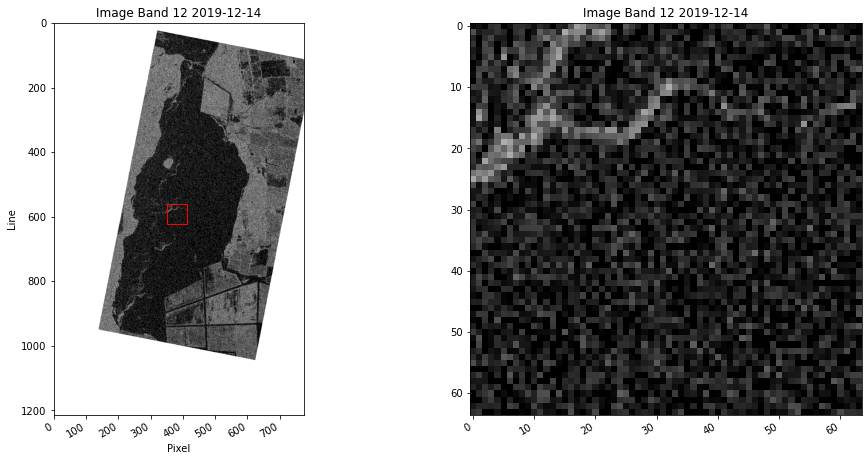

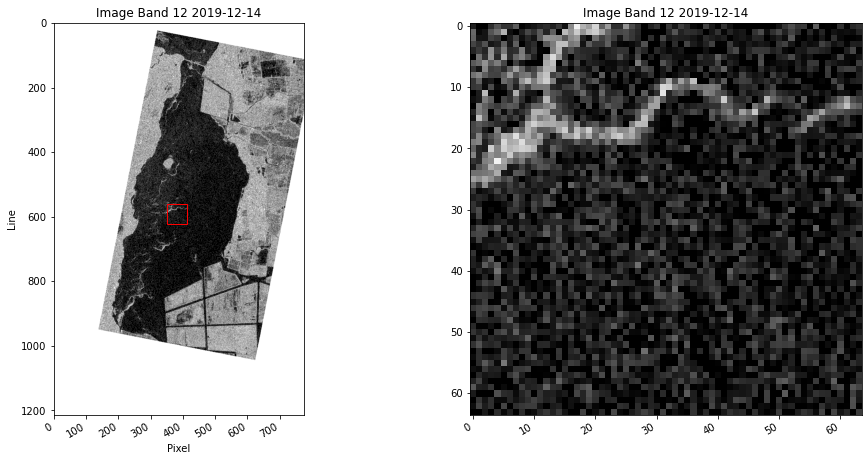

In [39]:
bandnbr=12
subset=[350,560,ws,ws]
tr_vv_11=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_11=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


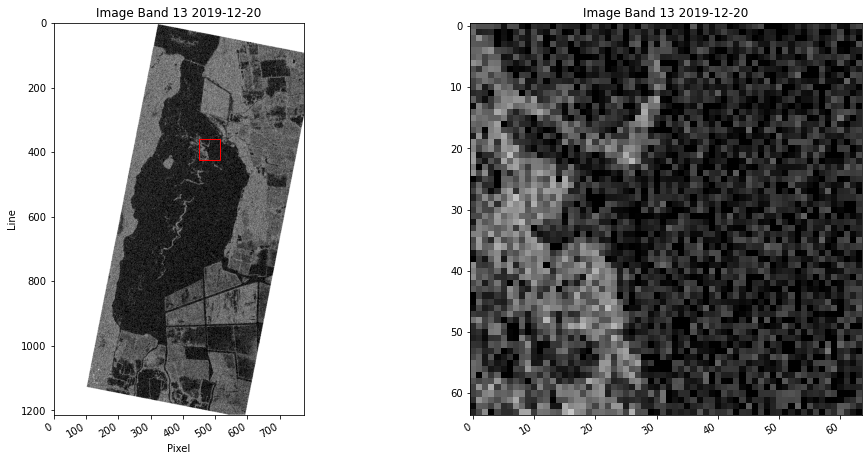

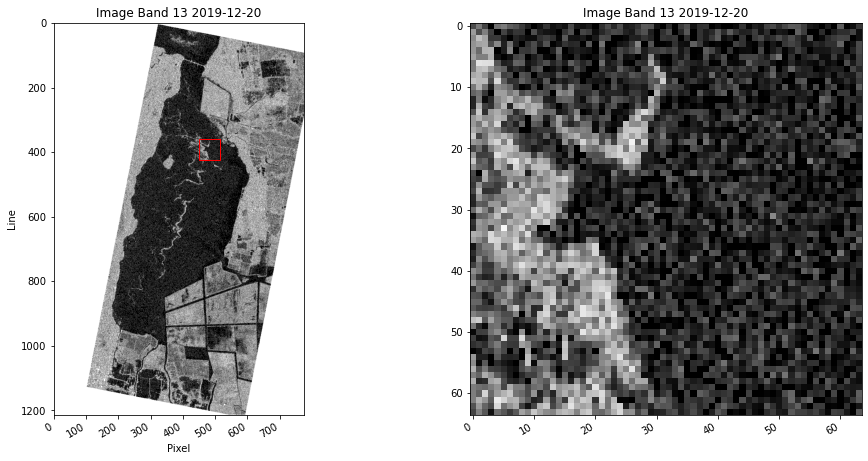

In [40]:
bandnbr=13

subset=[450,360,ws,ws]
tr_vv_12=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_12=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


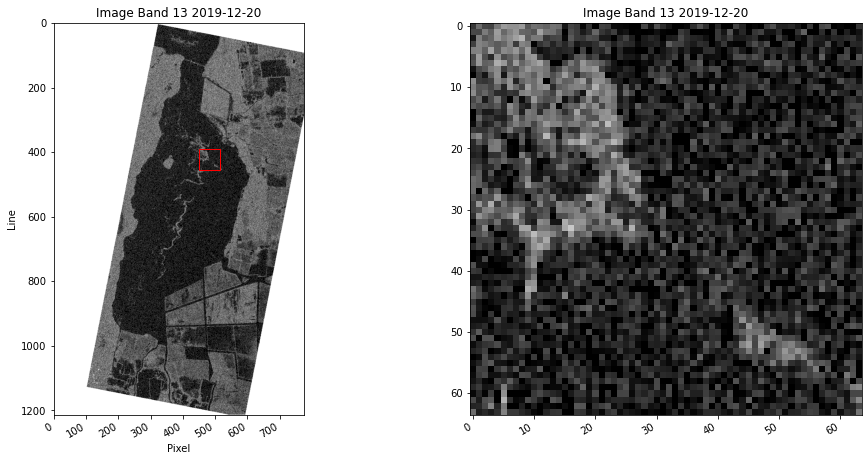

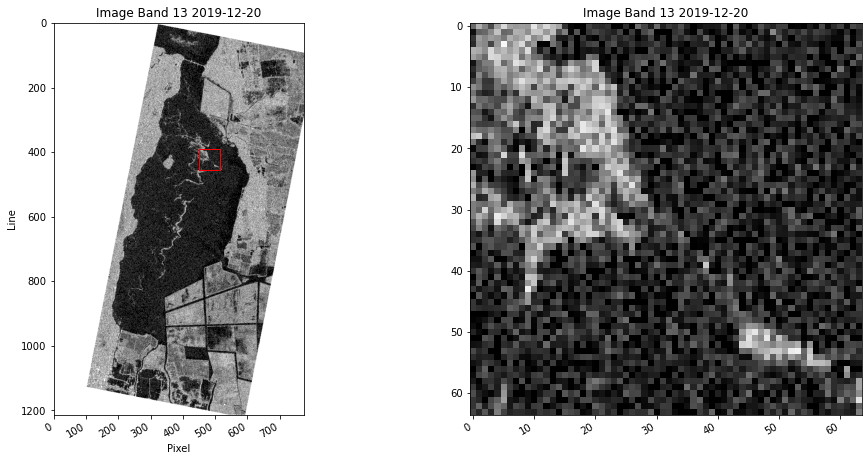

In [41]:

bandnbr=13
subset=[450,390,ws,ws]
tr_vv_13=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_13=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


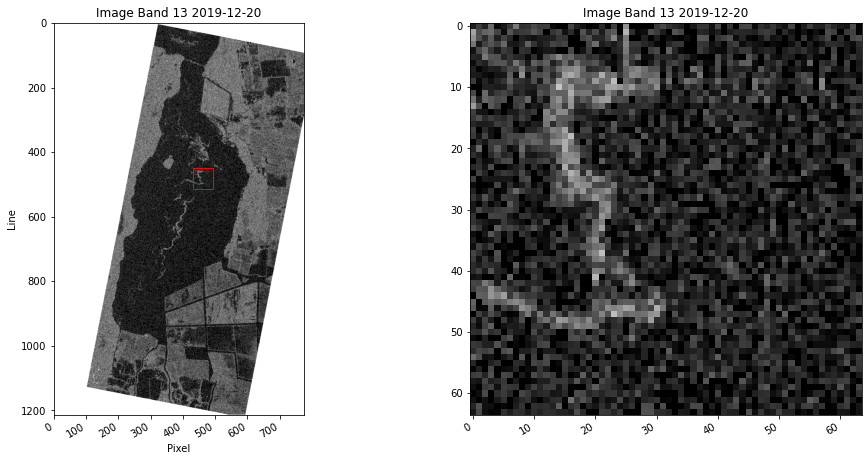

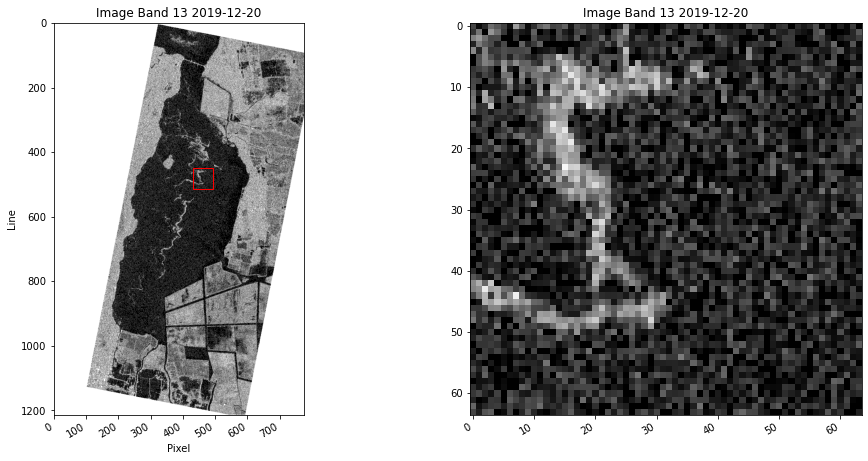

In [42]:

bandnbr=13
subset=[430,450,ws,ws]
tr_vv_14=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_14=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)



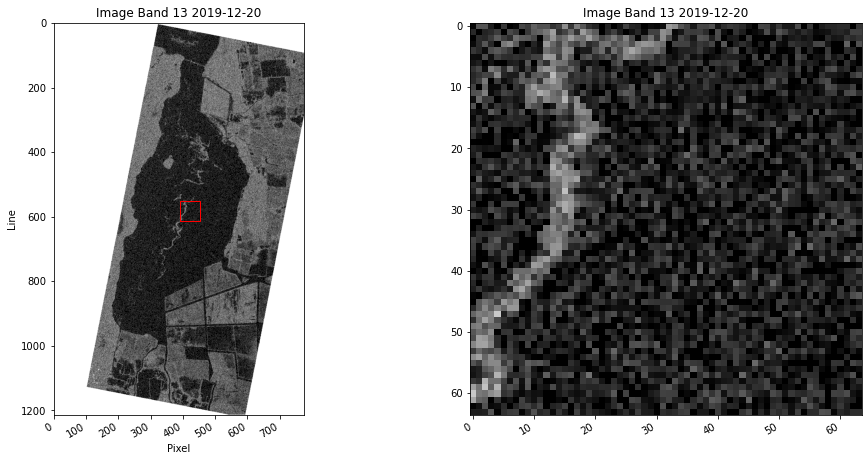

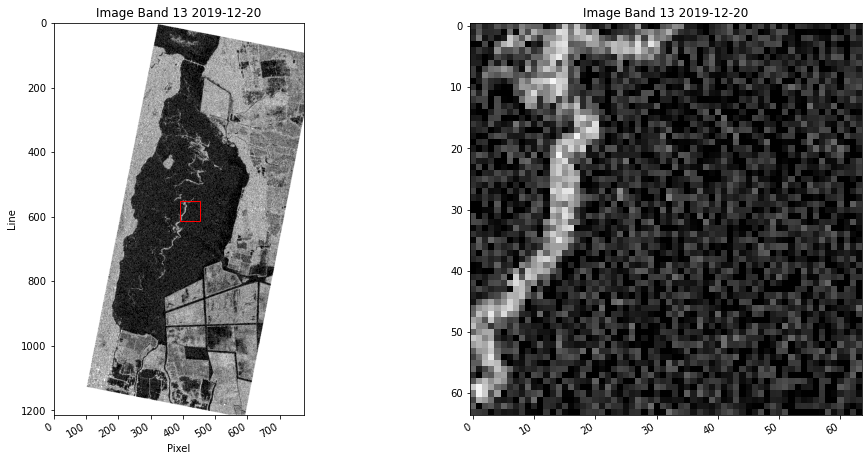

In [43]:

bandnbr=13
subset=[390,550,ws,ws]
tr_vv_15=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_15=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)


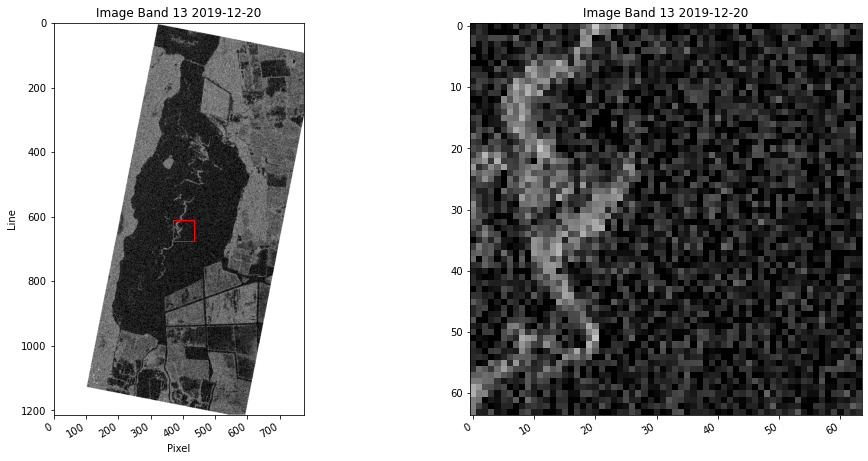

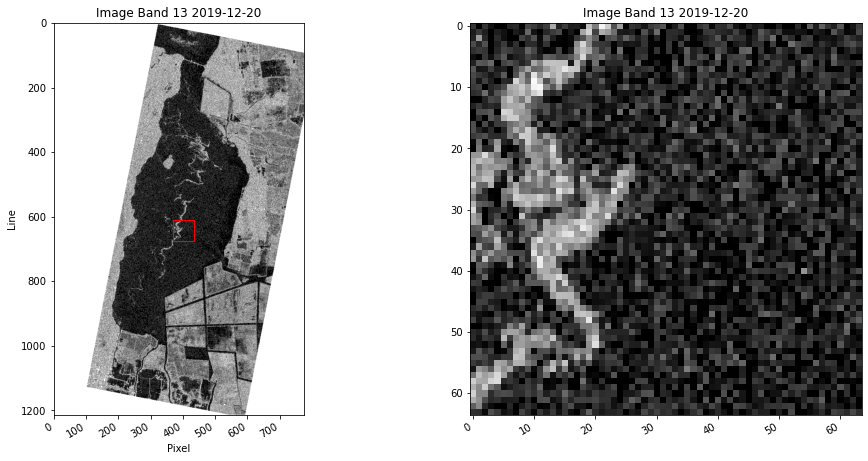

In [44]:
bandnbr=13
subset=[370,610,ws,ws]
tr_vv_16=showImgSubImg(rasterstack_vv,tindex,bandnbr,subset)
tr_vh_16=showImgSubImg(rasterstack_vh,tindex,bandnbr,subset)

In [45]:
tr_vv_16.shape

(64, 64)

In [46]:
X_band_1=np.stack((tr_vv_1,tr_vv_2,
                       tr_vv_3,tr_vv_4,
                       tr_vv_5,tr_vv_6,tr_vv_7,tr_vv_8,tr_vv_9,
                       tr_vv_10,tr_vv_11,tr_vv_12,tr_vv_13,
                       tr_vv_14,tr_vv_15,tr_vv_16,
                      tr_vv_1_c,tr_vv_2_c,
                      tr_vv_4_c,tr_vv_4_c,
                       tr_vv_5_c,tr_vv_6_c,tr_vv_7_c,tr_vv_8_c,tr_vv_9_c,
                       tr_vv_10_c,tr_vv_11_c,tr_vv_12_c,tr_vv_13_c,
                       tr_vv_14_c,tr_vv_15_c,tr_vv_16_c))
                    
X_band_2=np.stack((tr_vh_1,tr_vh_2,
                       tr_vh_3,tr_vh_4,
                       tr_vh_5,tr_vh_6,tr_vh_7,tr_vh_8,tr_vh_9,
                       tr_vh_10,tr_vh_11,tr_vh_12,tr_vh_13,
                       tr_vh_14,tr_vh_15,tr_vh_16,
                       tr_vh_1_c,tr_vh_2_c,
                       tr_vh_4_c,tr_vh_4_c,
                       tr_vh_5_c,tr_vh_6_c,tr_vh_7_c,tr_vh_8_c,tr_vh_9_c,
                       tr_vh_10_c,tr_vh_11_c,tr_vh_12_c,tr_vh_13_c,
                       tr_vh_14_c,tr_vh_15_c,tr_vh_16_c))

In [47]:
X_train = np.concatenate([X_band_1[:, :, :, np.newaxis], X_band_2[:, :, :, np.newaxis],((X_band_1-X_band_2))[:, :, :, np.newaxis]], axis=-1)

In [48]:
datafolder

'C:\\Users\\vaak\\Desktop\\UoS\\weedwatch project\\S1_Vembanad\\STK'

In [54]:
np.save(datafolder + '\TrainingData_Vembanadlake_64', X_train)

In [50]:
!pip3 install plotly

In [51]:
#Take a look at a iceberg
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)
def plotmy3d(c, name):

    data = [
        go.Surface(
            z=c
        )
    ]
    layout = go.Layout(
        title=name,
        autosize=False,
        width=900,
        height=700,
        margin=dict(
            l=65,
            r=50,
            b=65,
            t=90
        )
    )
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)
plotmy3d(X_band_1[3,:,:], 'WH')

In [52]:
plotmy3d(X_band_2[10,:,:], 'infested water')

In [53]:
plotmy3d(X_band_1[20,:,:], 'clean water')